In [7]:
#Import libraries
import pandas as pd
from matplotlib import pylab
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import seaborn as sns
import matplotlib as ax
import plotly.express as px

2022 DATASET

In [3]:
# IMPORT THE DATASET

elon_2022=pd.read_csv("2022.csv")

#SELECT THE TWEETS COLUMN
elon_2022=elon_2022.iloc[:,10:11]

# REMOVE THE @MENTIONS , PUNCTUATIONS AND CONVERT THE STRING TO LOWER CASE AND SPLIT THE WORDS AND PUT IT IN DF
elon_2022["mytext_new"] = elon_2022['tweet'].str.lower().str.replace('@[A-Za-z0-9_]+','')
elon_2022["mytext_new"] = elon_2022['mytext_new'].str.lower().str.replace('[^\w\s]','')
new_df = elon_2022.mytext_new.str.split(expand=True).stack().value_counts().reset_index()

new_df.columns = ['Word', 'Frequency'] 
new_df

<ipython-input-3-71b45f618e74>:9: FutureWarning: The default value of regex will change from True to False in a future version.
  elon_2022["mytext_new"] = elon_2022['tweet'].str.lower().str.replace('@[A-Za-z0-9_]+','')
<ipython-input-3-71b45f618e74>:10: FutureWarning: The default value of regex will change from True to False in a future version.
  elon_2022["mytext_new"] = elon_2022['mytext_new'].str.lower().str.replace('[^\w\s]','')


,Word,Frequency
0,the,248
1,is,238
2,to,230
3,a,206
4,of,164
...,...,...
1689,history,2
1690,hi,2
1691,dc,2
1692,irs,2


A) WORD FREQUENCY FOR THE YEAR 2022

In [4]:
#REMOVE THE STOP WORDS
stop_words=['this','just','hi','do','was','would','than','yeah','you','more','some','and','no','our','from','should','most','of','is','or','to','a','the','for','i','are','it','with','as','amp','so','that','will','in','on','an','all','be','we','but','not','at','have','if','there','they','yes']

# word requencies for year 2022
new_df = new_df[new_df.Word.isin(stop_words) == False]
new_df

,Word,Frequency
17,tesla,62
30,people,34
37,one,30
38,good,28
39,starlink,28
...,...,...
1688,cookie,2
1689,history,2
1691,dc,2
1692,irs,2


a) Top 10 words USED IN 2022 TWEETS

In [5]:
#top 10 words of 2022
top_10_2022= new_df.iloc[0:10]
top_10_2022

,Word,Frequency
17,tesla,62
30,people,34
37,one,30
38,good,28
39,starlink,28
41,car,26
44,true,22
45,great,22
46,high,22
48,make,20


Histogram of word frequencies

In [12]:
# HISTOGRAM OF EACH WORD 2022
#sns.set(rc={'figure.figsize':(20.7,10.27)})
px.histogram(new_df, x ='Word',y='Frequency',nbins=50)

Adding rank to the df which proves zipf law i.e.  the word frequencies are inversely proportional to their rank

In [13]:
#Rank
x=len(new_df['Frequency'])
new_df['Ranks']=range(1,x+1)
new_df

<ipython-input-13-8853d994efa2>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Word,Frequency,Ranks
17,tesla,62,1
30,people,34,2
37,one,30,3
38,good,28,4
39,starlink,28,5
...,...,...,...
1688,cookie,2,1643
1689,history,2,1644
1691,dc,2,1645
1692,irs,2,1646


PLOTTING LOGLOG PLOTS OF WORD FREQUENCY AND RANK

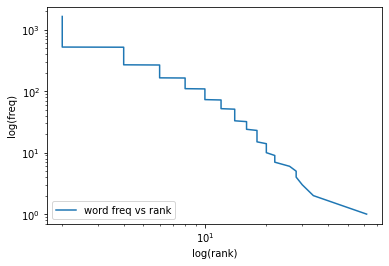

In [14]:
#Plotting log freq vs log count using zipfs law
pylab.loglog(new_df["Frequency"], new_df["Ranks"], label="word freq vs rank")
pylab.xlabel('log(rank)')
pylab.ylabel('log(freq)')
pylab.legend(loc='lower left')
pylab.show()

In [15]:
freq_2022=new_df.copy()


CREATING BIGRAM NETWORK AND BIGRAM NETWORK GRAPHS

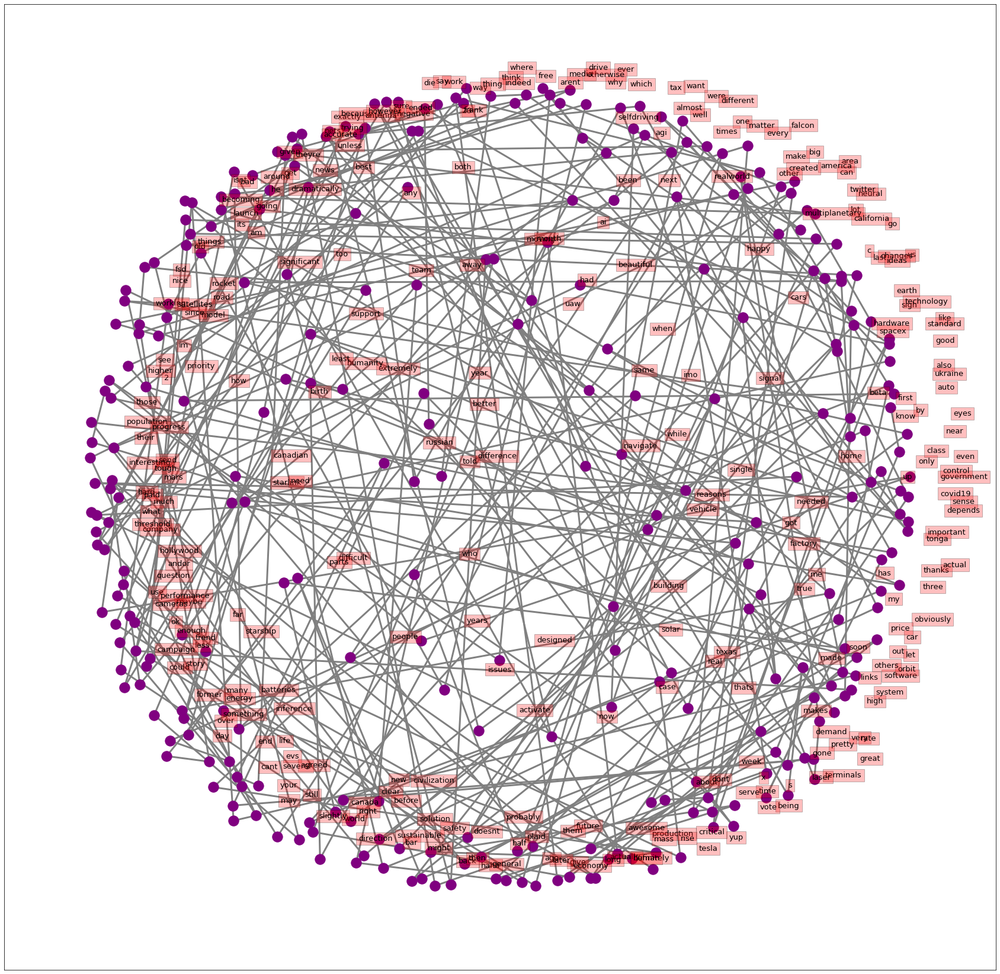

In [16]:
#create bigrams

freq_2022=freq_2022.iloc[:,0:1]
freq_list=freq_2022["Word"].tolist()

from nltk.util import bigrams

bigrams=list(nltk.bigrams(freq_list))

bigrams_dist=nltk.FreqDist(bigrams)
df_bigram=pd.DataFrame(bigrams_dist.most_common(300),columns=['Bigrams','Frequency'])


#BIGRAM
# Create dictionary of bigrams and their counts
d = df_bigram.set_index('Bigrams').T.to_dict('records')

# Create network plot 
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(30, 30))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='purple',
                 with_labels = False,
                 ax=ax)

for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
plt.show()


YEAR 2021

In [17]:
# IMPORT THE DATASET

elon_2021=pd.read_csv("2021.csv")
#elon_2021
#SELECT THE TWEETS COLUMN
elon_2021=elon_2021.iloc[:,10:11]

elon_2021["mytext_new"] = elon_2021['tweet'].str.lower().str.replace('@[A-Za-z0-9_]+','')
elon_2021["mytext_new"] = elon_2021['mytext_new'].str.lower().str.replace('[^\w\s]','')
new_df_1 = elon_2021.mytext_new.str.split(expand=True).stack().value_counts().reset_index()
new_df_1.columns = ['Word', 'Frequency'] 
new_df_1

<ipython-input-17-c57cb00a471c>:8: FutureWarning:

The default value of regex will change from True to False in a future version.

<ipython-input-17-c57cb00a471c>:9: FutureWarning:

The default value of regex will change from True to False in a future version.



,Word,Frequency
0,to,918
1,is,851
2,the,777
3,a,608
4,of,572
...,...,...
5810,rallying,1
5811,retraining,1
5812,guns,1
5813,httpstcom7j2sjvnit,1


In [62]:
#REMOVE THE STOP WORDS
stop_words=['this','just','its','my','haha','out','with','an','about','over','hi','can','while','true','make','what','me','do','like','much','has','many','by','only','when','was','would','do','was','would','than','yeah','you','more','some','and','no','our','from','should','most','of','is','or','to','a','the','for','i','are','it','with','as','amp','so','that','will','in','on','an','all','be','we','but','not','at','have','if','there','they','yes']

# word requencies for year 2021
new_df_1 = new_df_1[new_df_1.Word.isin(stop_words) == False]
new_df_1

,Word,Frequency,Ranks
18,tesla,206,1
35,great,102,3
37,good,98,4
50,time,80,7
51,beta,77,8
...,...,...,...
5810,rallying,1,5750
5811,retraining,1,5751
5812,guns,1,5752
5813,httpstcom7j2sjvnit,1,5753


In [63]:
#top 10 words of 2021
top_10_2021= new_df_1.iloc[0:10]
top_10_2021

,Word,Frequency,Ranks
18,tesla,206,1
35,great,102,3
37,good,98,4
50,time,80,7
51,beta,77,8
53,work,73,9
57,high,71,10
61,production,67,12
63,next,67,13
65,one,65,14


In [20]:
# HISTOGRAM OF EACH WORD 2022
#sns.set(rc={'figure.figsize':(20.7,10.27)})
px.histogram(new_df_1, x ='Word',y='Frequency',nbins=50)

In [64]:
#Rank
x=len(new_df_1['Frequency'])
new_df_1['Ranks']=range(1,x+1)
new_df_1

<ipython-input-64-019f1e8a6ff1>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Word,Frequency,Ranks
18,tesla,206,1
35,great,102,2
37,good,98,3
50,time,80,4
51,beta,77,5
...,...,...,...
5810,rallying,1,5746
5811,retraining,1,5747
5812,guns,1,5748
5813,httpstcom7j2sjvnit,1,5749


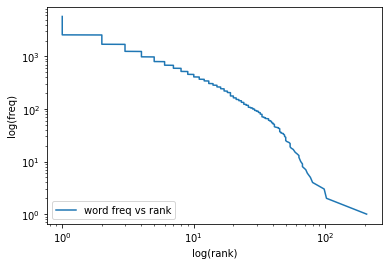

In [65]:
#Plotting log freq vs log count using zipfs law
pylab.loglog(new_df_1["Frequency"], new_df_1["Ranks"], label="word freq vs rank")
pylab.xlabel('log(rank)')
pylab.ylabel('log(freq)')
pylab.legend(loc='lower left')
pylab.show()

In [66]:
freq_2021=new_df_1.copy()


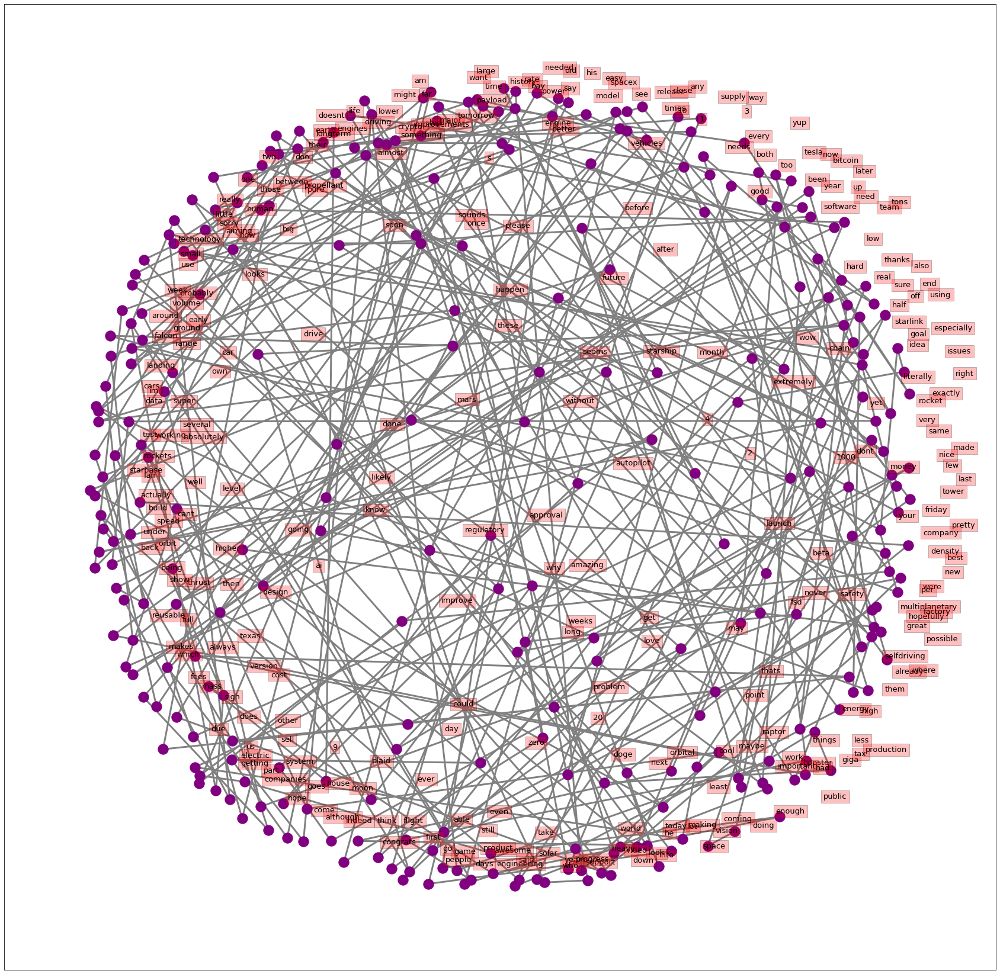

In [67]:
#create bigrams

freq_2021=freq_2021.iloc[:,0:1]
freq_list=freq_2021["Word"].tolist()

from nltk.util import bigrams

bigrams=list(nltk.bigrams(freq_list))

bigrams_dist=nltk.FreqDist(bigrams)
df_bigram=pd.DataFrame(bigrams_dist.most_common(300),columns=['Bigrams','Frequency'])


#BIGRAM
# Create dictionary of bigrams and their counts
d = df_bigram.set_index('Bigrams').T.to_dict('records')

# Create network plot 
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(30, 30))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='purple',
                 with_labels = False,
                 ax=ax)

for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
plt.show()

YEAR 2020

In [25]:
elon_2020=pd.read_csv("2020.csv")
#elon_2020
elon_2020=elon_2020.iloc[:,7:8]
#elon_2020

# REMOVE THE @MENTIONS , PUNCTUATIONS AND CONVERT THE STRING TO LOWER CASE AND SPLIT THE WORDS AND PUT IT IN DF

elon_2020["mytext_new"] = elon_2020['tweet'].str.lower().str.replace('@[A-Za-z0-9_]+','')
elon_2020["mytext_new"] = elon_2020['mytext_new'].str.lower().str.replace('[^\w\s]','')
new_df_2 = elon_2020.mytext_new.str.split(expand=True).stack().value_counts().reset_index()
new_df_2.columns = ['Word', 'Frequency'] 
new_df_2

<ipython-input-25-ed429417792b>:8: FutureWarning:

The default value of regex will change from True to False in a future version.

<ipython-input-25-ed429417792b>:9: FutureWarning:

The default value of regex will change from True to False in a future version.



,Word,Frequency
0,to,3765
1,the,3489
2,a,2887
3,is,2653
4,of,2523
...,...,...
14674,embrace,1
14675,apartment,1
14676,landlords,1
14677,httpstcozzn9tabq8c,1


In [71]:
#REMOVE THE STOP WORDS
stop_words=['this','just','its','my','were','with','now','an','3','also','out','one','too','about','over','hi','can','while','true','make','what','me','do','like','much','has','many','by','only','when','was','would','do','was','would','than','yeah','you','more','some','and','no','our','from','should','most','of','is','or','to','a','the','for','i','are','it','with','as','amp','so','that','will','in','on','an','all','be','we','but','not','at','have','if','there','they','yes']

# word requencies for year 2020
new_df_2 = new_df_2[new_df_2.Word.isin(stop_words) == False]
new_df_2

,Word,Frequency,Ranks
14,tesla,1023,1
36,good,471,2
39,model,403,3
44,great,370,4
50,car,322,5
...,...,...,...
14674,embrace,1,14605
14675,apartment,1,14606
14676,landlords,1,14607
14677,httpstcozzn9tabq8c,1,14608


In [72]:
#Rank
x=len(new_df_2['Frequency'])
new_df_2['Ranks']=range(1,x+1)
new_df_2

<ipython-input-72-d1b77248b7cc>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Word,Frequency,Ranks
14,tesla,1023,1
36,good,471,2
39,model,403,3
44,great,370,4
50,car,322,5
...,...,...,...
14674,embrace,1,14604
14675,apartment,1,14605
14676,landlords,1,14606
14677,httpstcozzn9tabq8c,1,14607


In [73]:
#top 10 words of 2020
top_10_2020= new_df_2.iloc[0:10]
top_10_2020

,Word,Frequency,Ranks
14,tesla,1023,1
36,good,471,2
39,model,403,3
44,great,370,4
50,car,322,5
60,time,269,6
62,next,259,7
64,high,254,8
66,people,253,9
69,rocket,243,10


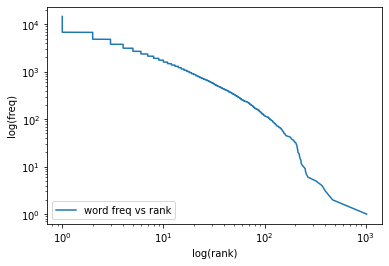

In [74]:
#Plotting log freq vs log count using zipfs law
pylab.loglog(new_df_2["Frequency"], new_df_2["Ranks"], label="word freq vs rank")
pylab.xlabel('log(rank)')
pylab.ylabel('log(freq)')
pylab.legend(loc='lower left')
pylab.show()

In [75]:
# HISTOGRAM OF EACH WORD 2022
#sns.set(rc={'figure.figsize':(20.7,10.27)})
px.histogram(new_df_2, x ='Word',y='Frequency',nbins=50)

In [76]:
freq_2020=new_df_2.copy()


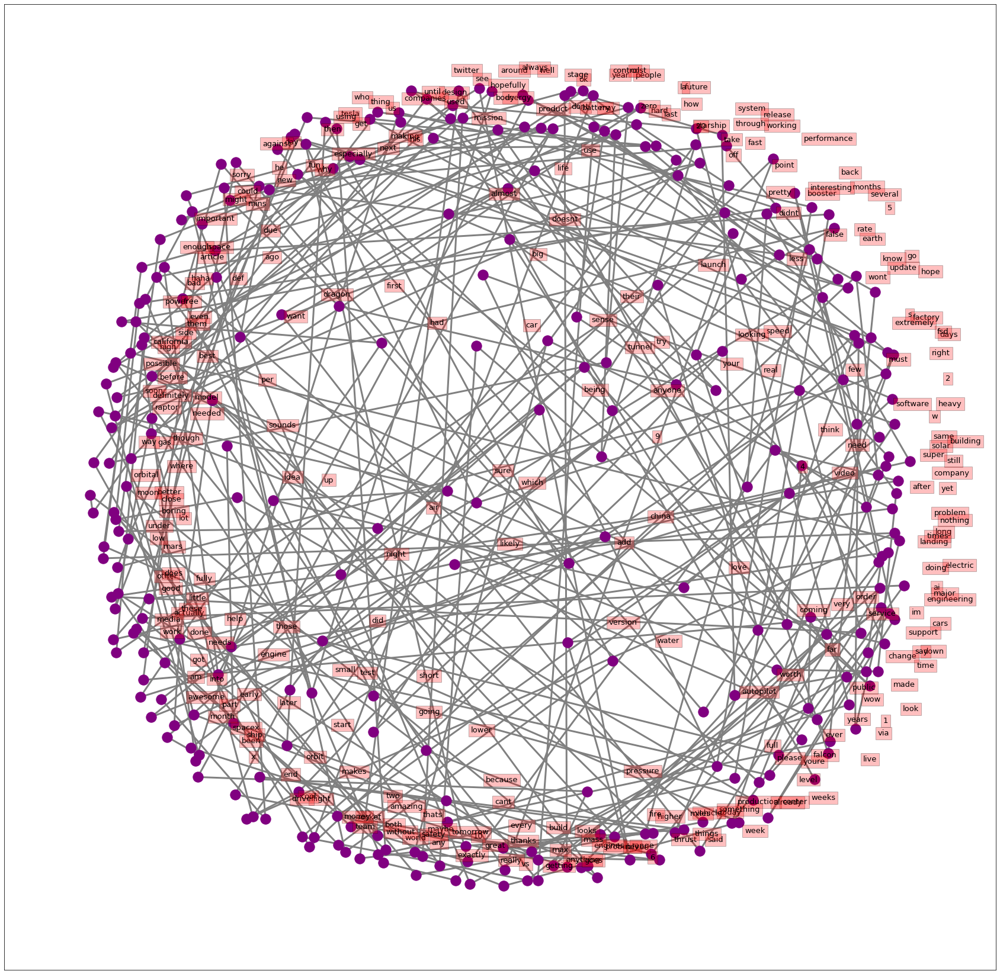

In [77]:
#create bigrams

freq_2020=freq_2020.iloc[:,0:1]
freq_list=freq_2020["Word"].tolist()

from nltk.util import bigrams
#x=list(bigrams(freq_list))
bigrams=list(nltk.bigrams(freq_list))

bigrams_dist=nltk.FreqDist(bigrams)
df_bigram=pd.DataFrame(bigrams_dist.most_common(300),columns=['Bigrams','Frequency'])


#BIGRAM
# Create dictionary of bigrams and their counts
d = df_bigram.set_index('Bigrams').T.to_dict('records')

# Create network plot 
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(30, 30))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='purple',
                 with_labels = False,
                 ax=ax)

for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
plt.show()

YEAR 2019

In [78]:
elon_2019=pd.read_csv("2019.csv")
#elon_2020
elon_2019=elon_2019.iloc[:,7:8]
#elon_2020

# REMOVE THE @MENTIONS , PUNCTUATIONS AND CONVERT THE STRING TO LOWER CASE AND SPLIT THE WORDS AND PUT IT IN DF

elon_2019["mytext_new"] = elon_2019['tweet'].str.lower().str.replace('@[A-Za-z0-9_]+','')
elon_2019["mytext_new"] = elon_2019['mytext_new'].str.lower().str.replace('[^\w\s]','')
new_df_3 = elon_2019.mytext_new.str.split(expand=True).stack().value_counts().reset_index()
new_df_3.columns = ['Word', 'Frequency'] 
new_df_3

<ipython-input-78-7e7e46618b0b>:8: FutureWarning:

The default value of regex will change from True to False in a future version.

<ipython-input-78-7e7e46618b0b>:9: FutureWarning:

The default value of regex will change from True to False in a future version.



,Word,Frequency
0,to,2843
1,the,2589
2,a,2118
3,of,1850
4,is,1804
...,...,...
12358,inducement,1
12359,httpstco3y4m5l50qf,1
12360,inform,1
12361,anyplace,1


In [79]:
#REMOVE THE STOP WORDS
stop_words=['this','just','its','my','with','an','3','also','out','one','too','about','over','hi','can','while','true','make','what','me','do','like','much','has','many','by','only','when','was','would','do','was','would','than','yeah','you','more','some','and','no','our','from','should','most','of','is','or','to','a','the','for','i','are','it','with','as','amp','so','that','will','in','on','an','all','be','we','but','not','at','have','if','there','they','yes']

# word requencies for year 2019
new_df_3 = new_df_3[new_df_3.Word.isin(stop_words) == False]
new_df_3

,Word,Frequency
13,tesla,825
32,model,373
35,good,358
43,car,282
49,great,241
...,...,...
12358,inducement,1
12359,httpstco3y4m5l50qf,1
12360,inform,1
12361,anyplace,1


In [80]:
#Rank
x=len(new_df_3['Frequency'])
new_df_3['Ranks']=range(1,x+1)
new_df_3

<ipython-input-80-0be0cb38ef37>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Word,Frequency,Ranks
13,tesla,825,1
32,model,373,2
35,good,358,3
43,car,282,4
49,great,241,5
...,...,...,...
12358,inducement,1,12290
12359,httpstco3y4m5l50qf,1,12291
12360,inform,1,12292
12361,anyplace,1,12293


In [36]:
#top 10 words of 2019
top_10_2019= new_df_3.iloc[0:10]
top_10_2019

,Word,Frequency,Ranks
13,tesla,825,1
32,model,373,2
35,good,358,3
43,car,282,4
49,great,241,5
53,next,221,6
54,time,217,7
57,rocket,208,8
59,cars,199,9
66,people,184,10


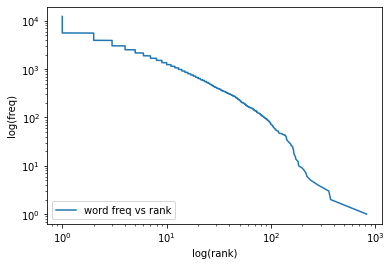

In [37]:
#Plotting log freq vs log count using zipfs law
pylab.loglog(new_df_3["Frequency"], new_df_3["Ranks"], label="word freq vs rank")
pylab.xlabel('log(rank)')
pylab.ylabel('log(freq)')
pylab.legend(loc='lower left')
pylab.show()

In [39]:
# HISTOGRAM OF EACH WORD 2019
#sns.set(rc={'figure.figsize':(20.7,10.27)})
px.histogram(new_df_3, x ='Word',y='Frequency',nbins=50)

In [40]:
freq_2019=new_df_3.copy()


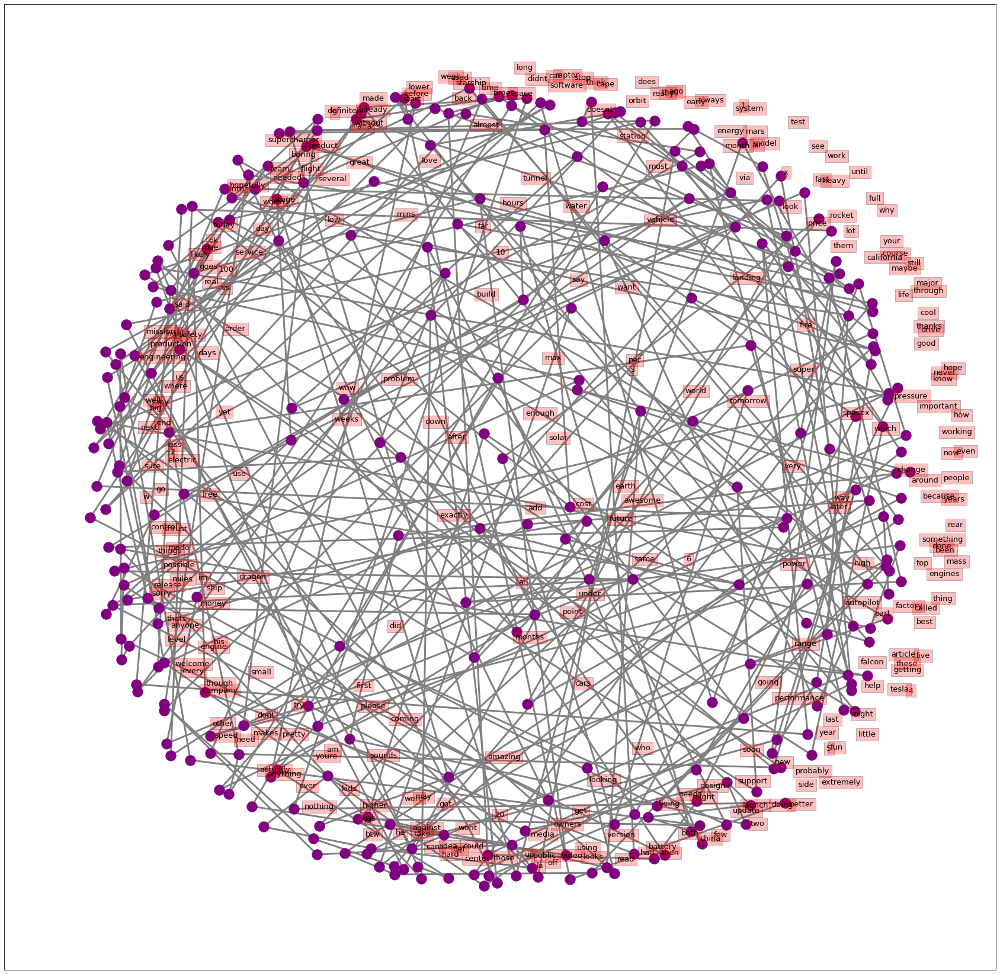

In [41]:
#create bigrams

freq_2019=freq_2019.iloc[:,0:1]
freq_list=freq_2019["Word"].tolist()

from nltk.util import bigrams
#x=list(bigrams(freq_list))
bigrams=list(nltk.bigrams(freq_list))

bigrams_dist=nltk.FreqDist(bigrams)
df_bigram=pd.DataFrame(bigrams_dist.most_common(300),columns=['Bigrams','Frequency'])


#BIGRAM
# Create dictionary of bigrams and their counts
d = df_bigram.set_index('Bigrams').T.to_dict('records')

# Create network plot 
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(30, 30))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='purple',
                 with_labels = False,
                 ax=ax)

for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
plt.show()

YEAR 2018

In [42]:
elon_2018=pd.read_csv("2018.csv")
#elon_2020
elon_2018=elon_2018.iloc[:,7:8]
#elon_2020

# REMOVE THE @MENTIONS , PUNCTUATIONS AND CONVERT THE STRING TO LOWER CASE AND SPLIT THE WORDS AND PUT IT IN DF

elon_2018["mytext_new"] = elon_2018['tweet'].str.lower().str.replace('@[A-Za-z0-9_]+','')
elon_2018["mytext_new"] = elon_2018['mytext_new'].str.lower().str.replace('[^\w\s]','')
new_df_4 = elon_2018.mytext_new.str.split(expand=True).stack().value_counts().reset_index()
new_df_4.columns = ['Word', 'Frequency'] 
new_df_4

<ipython-input-42-b93b438447be>:8: FutureWarning:

The default value of regex will change from True to False in a future version.

<ipython-input-42-b93b438447be>:9: FutureWarning:

The default value of regex will change from True to False in a future version.



,Word,Frequency
0,to,875
1,the,738
2,a,670
3,is,566
4,amp,524
...,...,...
5972,facilities,1
5973,oslo,1
5974,tooters,1
5975,permission,1


In [43]:
#REMOVE THE STOP WORDS
stop_words=['this','just','even','your','were','dont','its','who','my','with','an','3','youre','also','out','one','too','about','over','hi','can','while','true','make','what','me','do','like','much','has','many','by','only','when','was','would','do','was','would','than','yeah','you','more','some','and','no','our','from','should','most','of','is','or','to','a','the','for','i','are','it','with','as','amp','so','that','will','in','on','an','all','be','we','but','not','at','have','if','there','they','yes']

# word requencies for year 2019
new_df_4 = new_df_4[new_df_4.Word.isin(stop_words) == False]
new_df_4

,Word,Frequency
10,tesla,284
30,car,119
42,good,102
43,model,98
52,people,73
...,...,...
5972,facilities,1
5973,oslo,1
5974,tooters,1
5975,permission,1


In [44]:
#Rank
x=len(new_df_4['Frequency'])
new_df_4['Ranks']=range(1,x+1)
new_df_4

<ipython-input-44-739276877ff3>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Word,Frequency,Ranks
10,tesla,284,1
30,car,119,2
42,good,102,3
43,model,98,4
52,people,73,5
...,...,...,...
5972,facilities,1,5898
5973,oslo,1,5899
5974,tooters,1,5900
5975,permission,1,5901


In [45]:
#top 10 words of 2018
top_10_2018= new_df_4.iloc[0:10]
top_10_2018

,Word,Frequency,Ranks
10,tesla,284,1
30,car,119,2
42,good,102,3
43,model,98,4
52,people,73,5
61,next,63,6
63,great,62,7
68,time,57,8
70,cars,56,9
73,work,54,10


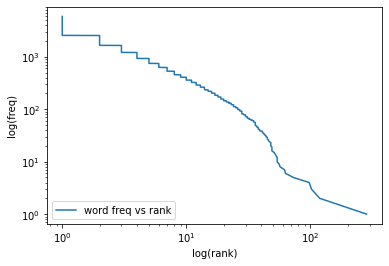

In [46]:
#Plotting log freq vs log count using zipfs law
pylab.loglog(new_df_4["Frequency"], new_df_4["Ranks"], label="word freq vs rank")
pylab.xlabel('log(rank)')
pylab.ylabel('log(freq)')
pylab.legend(loc='lower left')
pylab.show()

In [47]:
# HISTOGRAM OF EACH WORD 2022
#sns.set(rc={'figure.figsize':(20.7,10.27)})
px.histogram(new_df_4, x ='Word',y='Frequency',nbins=50)

In [48]:
freq_2018=new_df_4.copy()


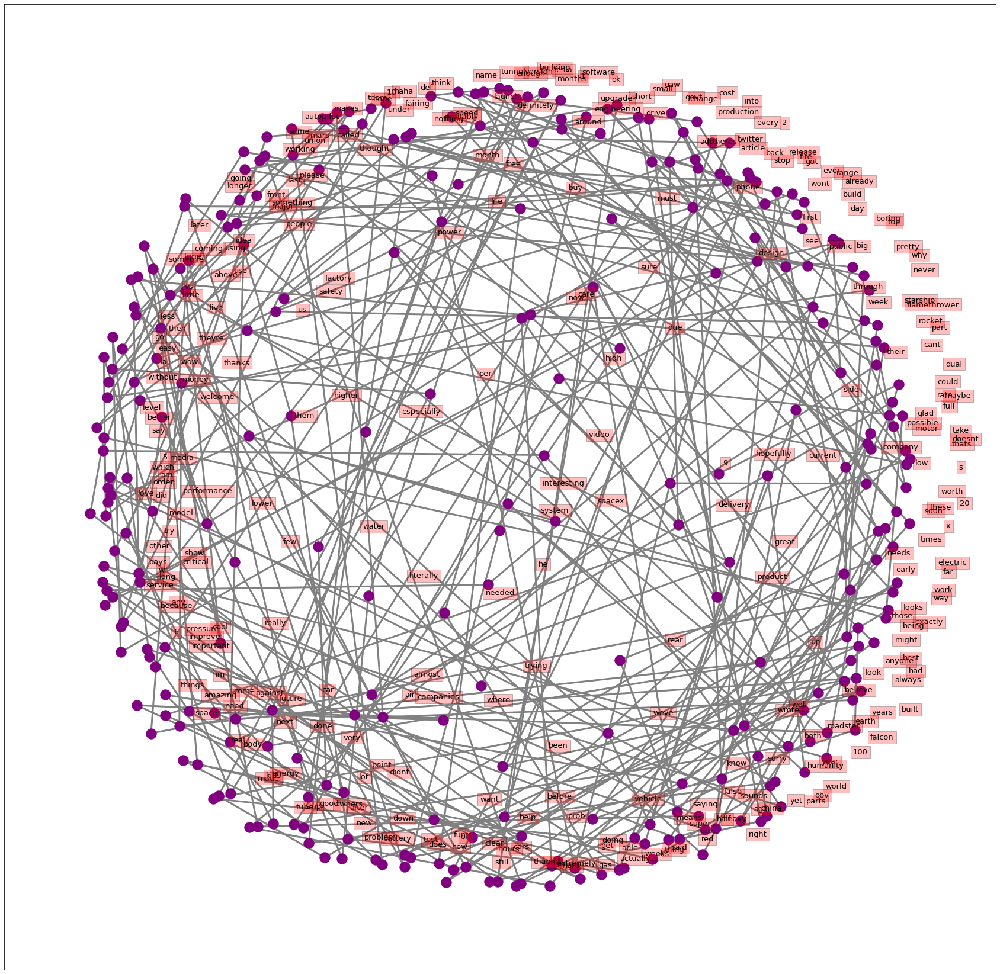

In [49]:
#create bigrams

freq_2018=freq_2018.iloc[:,0:1]
freq_list=freq_2018["Word"].tolist()

from nltk.util import bigrams
#x=list(bigrams(freq_list))
bigrams=list(nltk.bigrams(freq_list))

bigrams_dist=nltk.FreqDist(bigrams)
df_bigram=pd.DataFrame(bigrams_dist.most_common(300),columns=['Bigrams','Frequency'])


#BIGRAM
# Create dictionary of bigrams and their counts
d = df_bigram.set_index('Bigrams').T.to_dict('records')

# Create network plot 
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(30, 30))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='purple',
                 with_labels = False,
                 ax=ax)

for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
plt.show()

YEAR 2017

In [50]:
elon_2017=pd.read_csv("2017.csv")
#elon_2020
elon_2017=elon_2017.iloc[:,7:8]
#elon_2020

# REMOVE THE @MENTIONS , PUNCTUATIONS AND CONVERT THE STRING TO LOWER CASE AND SPLIT THE WORDS AND PUT IT IN DF

elon_2017["mytext_new"] = elon_2017['tweet'].str.lower().str.replace('@[A-Za-z0-9_]+','')
elon_2017["mytext_new"] = elon_2017['mytext_new'].str.lower().str.replace('[^\w\s]','')
new_df_5 = elon_2017.mytext_new.str.split(expand=True).stack().value_counts().reset_index()
new_df_5.columns = ['Word', 'Frequency'] 
new_df_5

<ipython-input-50-c5493e3654d3>:8: FutureWarning:

The default value of regex will change from True to False in a future version.

<ipython-input-50-c5493e3654d3>:9: FutureWarning:

The default value of regex will change from True to False in a future version.



,Word,Frequency
0,the,1294
1,to,1171
2,a,904
3,of,808
4,is,660
...,...,...
7422,tranport,1
7423,122,1
7424,17m,1
7425,12m,1


In [81]:
#REMOVE THE STOP WORDS
stop_words=['this','just','even','now','your','were','dont','its','who','my','with','an','3','youre','also','out','one','too','about','over','hi','can','while','true','make','what','me','do','like','much','has','many','by','only','when','was','would','do','was','s','would','than','yeah','you','more','some','and','no','our','from','should','most','of','is','or','to','a','the','for','i','are','it','with','as','amp','so','that','will','in','on','an','all','be','we','but','not','at','have','if','there','they','yes']

# word requencies for year 2019
new_df_5 = new_df_5[new_df_5.Word.isin(stop_words) == False]
new_df_5

,Word,Frequency,Ranks
13,tesla,298,1
23,model,208,2
28,good,171,3
32,rocket,149,4
44,launch,112,5
...,...,...,...
7422,tranport,1,7347
7423,122,1,7348
7424,17m,1,7349
7425,12m,1,7350


In [82]:
#Rank
x=len(new_df_5['Frequency'])
new_df_5['Ranks']=range(1,x+1)
new_df_5

<ipython-input-82-2e11c1ee1072>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Word,Frequency,Ranks
13,tesla,298,1
23,model,208,2
28,good,171,3
32,rocket,149,4
44,launch,112,5
...,...,...,...
7422,tranport,1,7346
7423,122,1,7347
7424,17m,1,7348
7425,12m,1,7349


In [83]:
#top 10 words of 2017
top_10_2017= new_df_5.iloc[0:10]
top_10_2017

,Word,Frequency,Ranks
13,tesla,298,1
23,model,208,2
28,good,171,3
32,rocket,149,4
44,launch,112,5
47,next,103,6
52,car,97,7
53,falcon,97,8
55,time,93,9
57,first,93,10


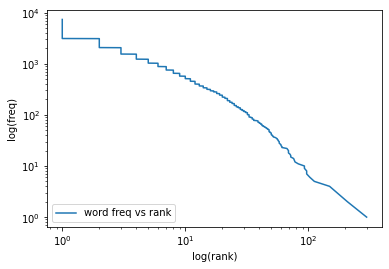

In [84]:
#Plotting log freq vs log count using zipfs law
pylab.loglog(new_df_5["Frequency"], new_df_5["Ranks"], label="word freq vs rank")
pylab.xlabel('log(rank)')
pylab.ylabel('log(freq)')
pylab.legend(loc='lower left')
pylab.show()

In [85]:
# HISTOGRAM OF EACH WORD 2022
#sns.set(rc={'figure.figsize':(20.7,10.27)})
px.histogram(new_df_5, x ='Word',y='Frequency',nbins=50)

In [86]:
freq_2017=new_df_5.copy()


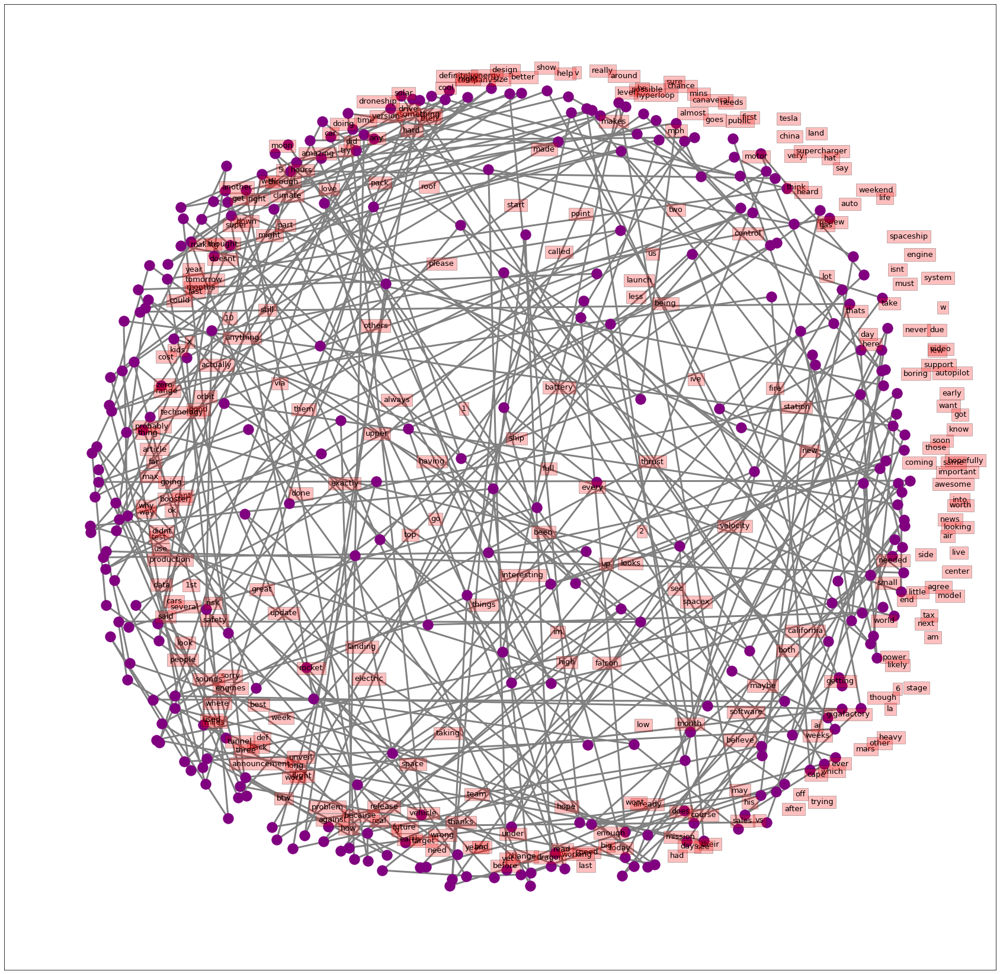

In [87]:
#create bigrams

freq_2017=freq_2017.iloc[:,0:1]
freq_list=freq_2017["Word"].tolist()

from nltk.util import bigrams
#x=list(bigrams(freq_list))
bigrams=list(nltk.bigrams(freq_list))

bigrams_dist=nltk.FreqDist(bigrams)
df_bigram=pd.DataFrame(bigrams_dist.most_common(300),columns=['Bigrams','Frequency'])


#BIGRAM
# Create dictionary of bigrams and their counts
d = df_bigram.set_index('Bigrams').T.to_dict('records')

# Create network plot 
G = nx.Graph()

# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 10))

fig, ax = plt.subplots(figsize=(30, 30))

pos = nx.spring_layout(G, k=2)

# Plot networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=3,
                 edge_color='grey',
                 node_color='purple',
                 with_labels = False,
                 ax=ax)

for key, value in pos.items():
    x, y = value[0]+.135, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13)
    
plt.show()